# Interactive Heat Island Analysis in Yuma, Arizona

This notebook demonstrates an interactive workflow for analyzing the Urban Heat Island (UHI) effect using `OSMSatLab`.  
We will load satellite imagery (Sentinel-2) and Land Surface Temperature (LST) data, visualize changes over time, and calculate correlations between vegetation/built-up areas and temperature.

In [19]:
from osmsatlab import OSMSatLab
from IPython.display import Image

## 1. Initialize the Laboratory

We start by initializing `OSMSatLab` for our target city, **Yuma, Arizona**. We also preload population data for year 2020 to set up the spatial context.

In [20]:
lab_Yuma = OSMSatLab(city="Yuma, Arizona", load_population_year=2020)

Successfully located 'Yuma, Arizona'


Loading population (2020):   0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area
Loading population (2020): 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

C:\Users\darey/.cache/osmsatlab/worldpop\usa_ppp_2020_1km_Aggregated.tif


## 2. Load Satellite Data

### 2.1 Load Land Surface Temperature (LST)
We fetch MODIS temperature data for January 2023 to June 2023. This data will be used to analyze heat patterns.

In [21]:
lab_Yuma.load_satellite_data(
    source="temperature",
    start_date="2023-01-01",
    end_date="2023-06-01",
)

Fetching temperature data from 2023-01-01 to 2023-06-01...
Using EPSG:32611
Found 298 MODIS scenes
[########################################] | 100% Completed | 12.54 s


<xarray.DataArray 'stackstac-5670a6cd473a82691329795315b425ff' (time: 23,
                                                                band: 1, y: 30,
                                                                x: 23)> Size: 127kB
array([[[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]]],


       [[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
...
          56.58142857, 56.59571429],
         [        nan,         nan,         nan, ..., 56.49857143,
          56.69285714, 56.61285714],
         [        nan,         nan,         nan, ..., 56.65285714,
          56.78714286, 56.76428571]]],


       [[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ..., 52.        ,
          51.925     , 52.025     ],
         [        nan,         nan,         nan, ..., 51.965     ,
          51.98      , 52.12      ],
         [        nan,         nan,         nan, ..., 52.085     ,
          52.275     , 52.255     ]]]], shape=(23, 1, 30, 23))
Coordinates: (12/16)
  * time                   (time) datetime64[ns] 184B 2023-01-01 ... 2023-06-04
  * band                   (band) <U11 44B 'LST_Day_1km'
  * y                      (y) float64 240B 3.625e+06 3.624e+06 ... 3.596e+06
  * x                      (x) float64 184B 7.16e+05 7.17e+05 ... 7.38e+05
    instruments            <U5 20B 'modis'
    modis:tile-id          <U8 32B '51008005'
    ...                     ...
    modis:vertical-tile    int64 8B 5
    proj:transform         object 8B {0.0, -926.6254331383334, -11119505.1976...
    title                  <U47 188B 'Daily daytime 1km grid Land-surface Tem...
    raster:bands           object 8B {'unit': 'Kelvin', 'scale': 0.02, 'data_...
    epsg                   int64 8B 32611
    spatial_ref            int64 8B 0
Attributes:
    spec:        RasterSpec(epsg=32611, bounds=(716000, 3595000, 739000, 3625...
    resolution:  1000
    units:       Celsius
    collection:  modis-11A1-061
    layer:       LST_Day_1km

### 2.2 Load Sentinel-2 Imagery
Next, we fetch high-resolution optical imagery from Sentinel-2 for the same period.  
We enable `add_ndvi` (Normalized Difference Vegetation Index) and `add_ndbi` (Normalized Difference Built-up Index) to calculate vegetation and built-up indices automatically.

In [22]:
lab_Yuma.load_satellite_data(
    source="sentinel2",
    start_date="2023-01-01",
    end_date="2023-06-01",
    cloud_cover_max=10,
    min_coverage=80,
    add_ndvi=True,
    add_ndbi=True,
    composite_period="1W",
    mask_clouds=True
)

Fetching sentinel2 data from 2023-01-01 to 2023-06-01...
Found 196 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 10%, Coverage >= 80%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 8.78 ss
Retained 39 scenes after local filtering (max 10%)
Compositing data over 1W using median...
[########################################] | 100% Completed | 552.37 s


<xarray.DataArray 'stackstac-ac2e9a1eaf92e848dec57befd90e1dc2' (time: 21,
                                                                band: 6,
                                                                y: 2858, x: 2185)> Size: 6GB
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]], shape=(21, 6, 2858, 2185))
Coordinates:
  * time         (time) datetime64[ns] 168B 2023-01-15 2023-01-22 ... 2023-06-04
  * band         (band) object 48B 'B02' 'B03' 'B04' 'B08' 'NDVI' 'NDBI'
  * y            (y) float64 23kB 3.624e+06 3.624e+06 ... 3.596e+06 3.596e+06
  * x            (x) float64 17kB 7.169e+05 7.169e+05 ... 7.388e+05 7.388e+05
    epsg         int64 8B 32611
    spatial_ref  int64 8B 0
Attributes:
    spec:             RasterSpec(epsg=32611, bounds=(716930, 3595890, 738780,...
    resolution:       10
    source:           Microsoft Planetary Computer
    collection:       sentinel-2-l2a
    start_date:       2023-01-01
    end_date:         2023-06-01
    cloud_cover_max:  10
    min_coverage:     80
    mask_clouds:      True
    ndvi_added:       True
    ndbi_added:       True

## 3. Visualize Changes Over Time

We can create time-lapse animations to visualize how the area changes.  
Here, we generate an RGB (True Color), NDVI, NDBI, and temperature animations.

Generating animation with 21 frames...
Saved animation to rgb_timelapse.gif


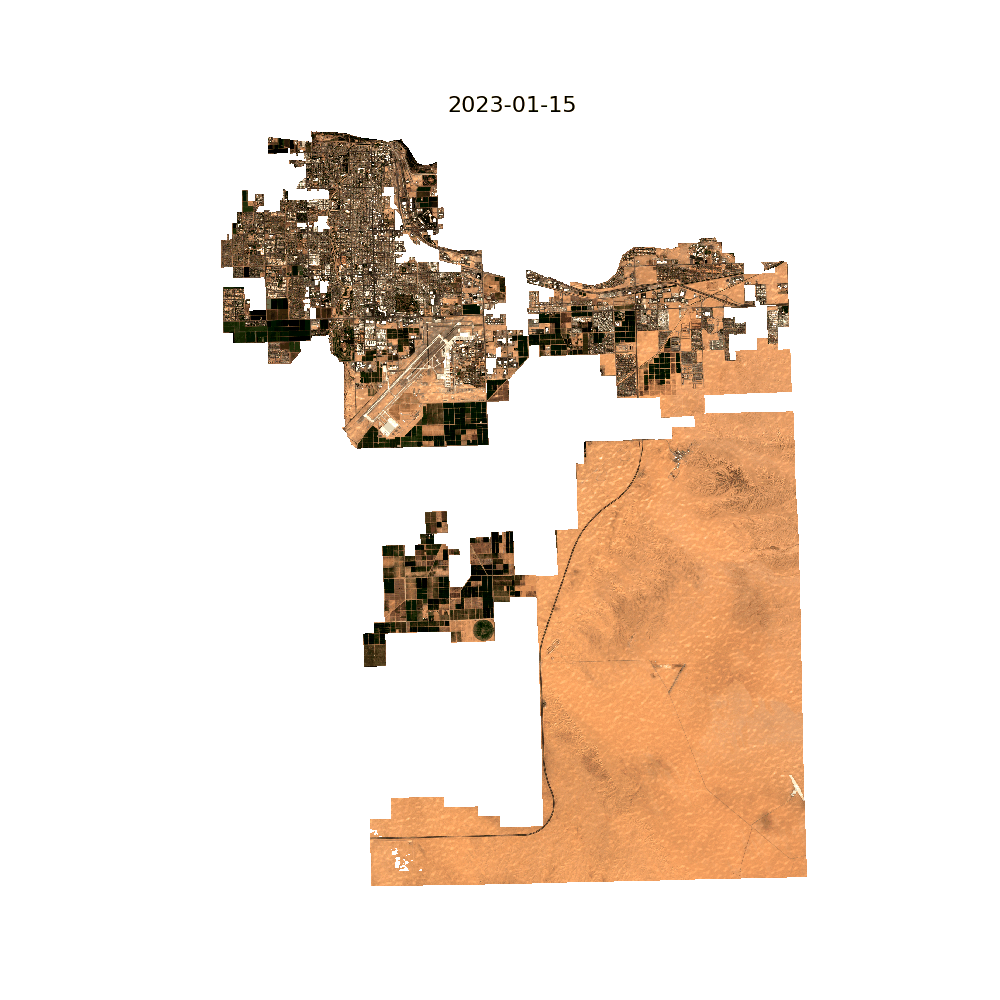

In [23]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="rgb_timelapse.gif",
    bands=["B04", "B03", "B02"],       # <--- Select the specific band        # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="rgb_timelapse.gif")

Generating animation with 21 frames...
Saved animation to ndbi_timelapse.gif


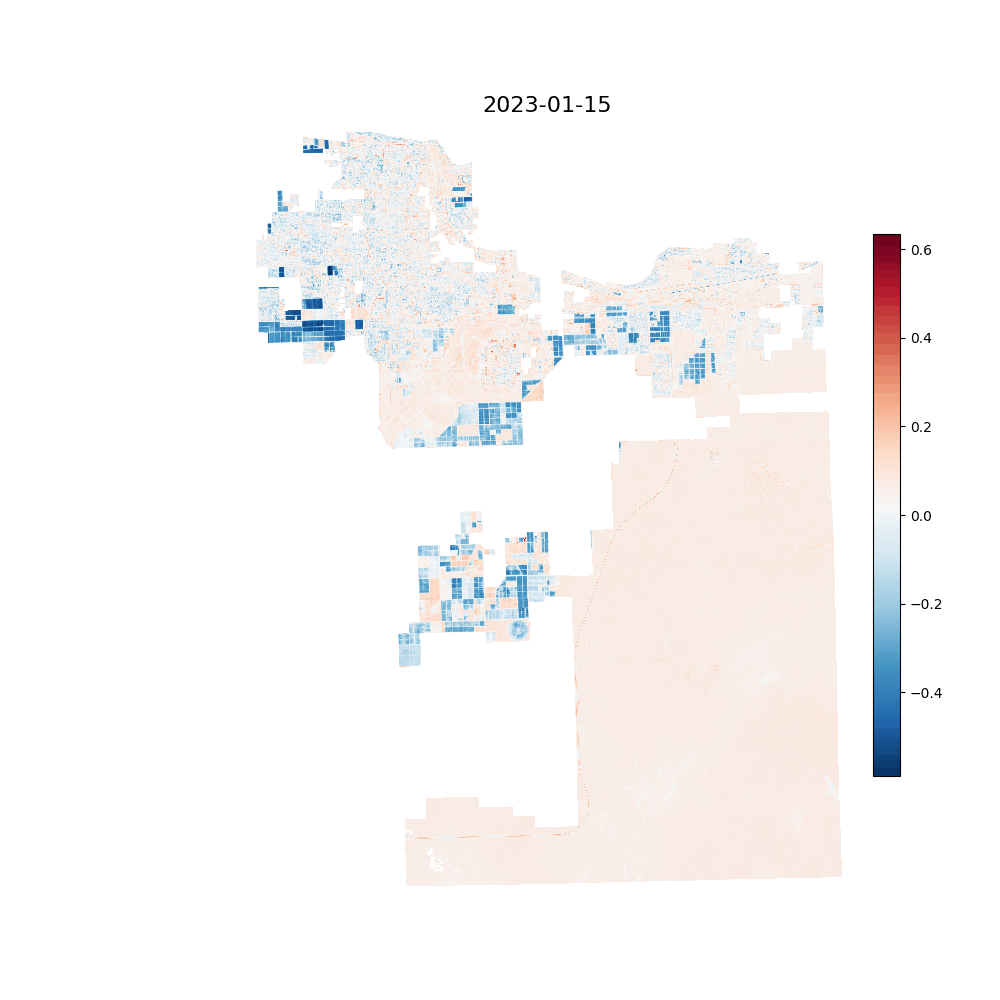

In [24]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="ndbi_timelapse.gif",
    bands=["NDBI"],       # <--- Select the specific band
    cmap="RdBu_r",         # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="ndbi_timelapse.gif")


Generating animation with 21 frames...
Saved animation to ndvi_timelapse.gif


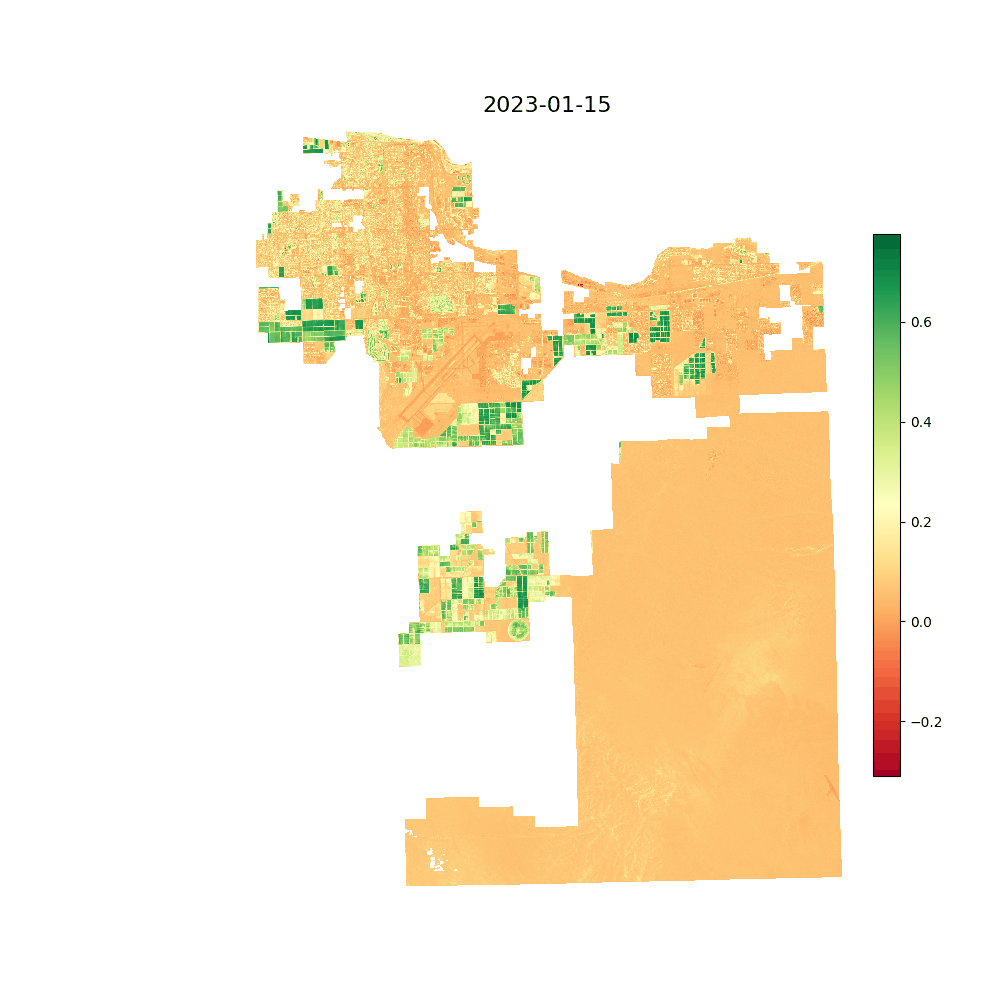

In [25]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="ndvi_timelapse.gif",
    bands=["NDVI"],       # <--- Select the specific band
    cmap="RdYlGn",         # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="ndvi_timelapse.gif")

Generating animation with 23 frames...
Saved animation to temperature_timelapse.gif


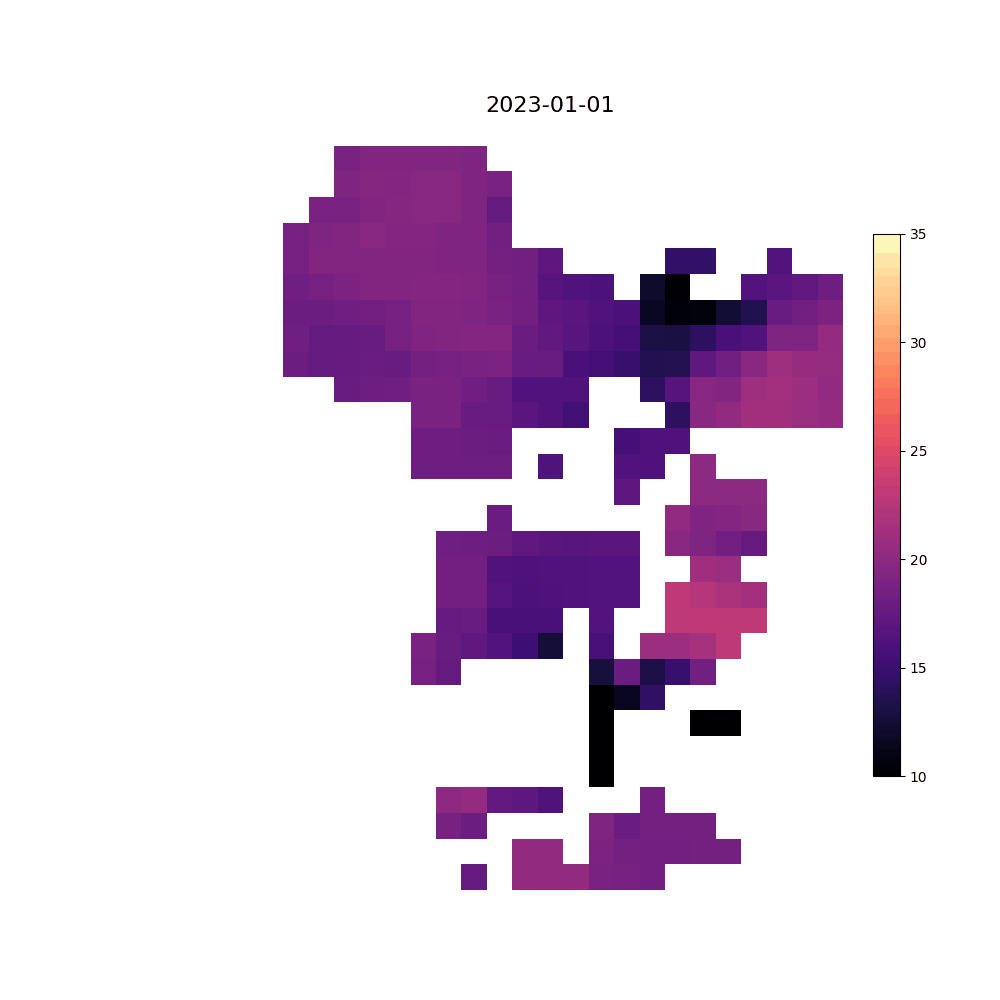

In [26]:
lab_Yuma.animate(
    source="temperature", 
    output_path="temperature_timelapse.gif",
    cmap="magma",         # or 'RdBu_r' for contrast
    vmin=10, vmax=35,
    fps=5,
    add_text=True
)
Image(filename="temperature_timelapse.gif")

## 4. Temporal Temperature Analysis

We can calculate and plot the **median temperature** over a longer period (2023-2025) to observe seasonal trends. This aggregates data weekly (`1W`).

Loaded data does not fully cover requested range. Fetching fresh data...
Fetching MODIS LST from 2023-01-01 to 2025-01-01...
Using EPSG:32611
Found 1461 MODIS scenes
[########################################] | 100% Completed | 75.76 s
Aggregating temperature data: 1W Median...


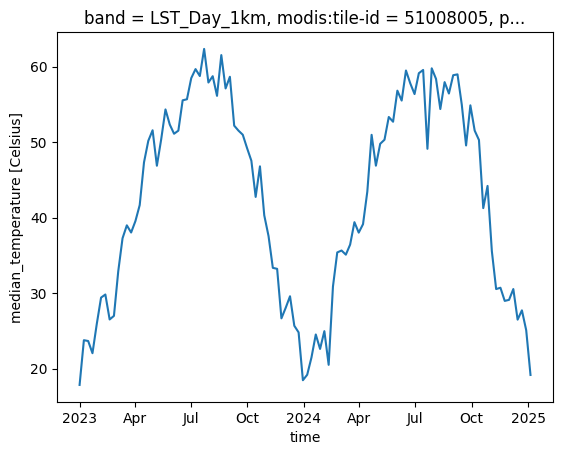

In [27]:
median_temperature_Yuma = lab_Yuma.calculate_temporal_temperature(
    start_date="2023-01-01", 
    end_date="2025-01-01", 
    aggregation="1W" # '1W', '2W', '1M' etc.
)
# Returns a DataArray with time steps: 2023-01-01, 2023-01-08...
median_temperature_Yuma.mean(dim=["x", "y"]).plot()

## 5. Correlation Analysis

Finally, we analyze the relationship between surface characteristics and temperature.  

### 5.1 Temperature vs. Vegetation (NDVI)
Does more vegetation lead to cooler temperatures? We calculate the correlation coefficient ($r$).

Reusing loaded temperature data for correlation (5 steps)...
Using pre-loaded LST data.
Fetching Sentinel-2 bands for NDVI...
Found 36 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 30%, Coverage >= 0%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 3.03 sms
Retained 7 scenes after local filtering (max 30%)
[########################################] | 100% Completed | 26.91 s
Creating Sentinel-2 Composite (Median)...
Calculating NDVI...
Aligning grids (Resampling Index to match LST)...
Computing Correlation on 304 pixels (Tensor=True)...
Correlation Coefficient (r): -0.3890
Correlation (Temperature vs NDVI): -0.38897659375281174


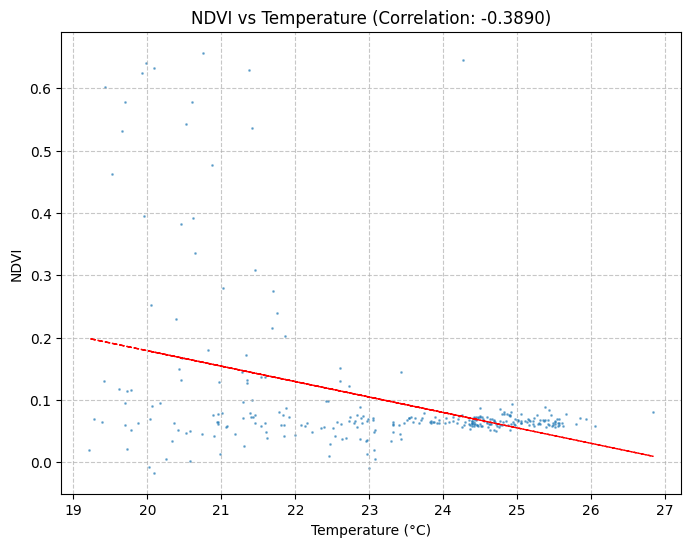

In [28]:
r_value_ndvi = lab_Yuma.calculate_correlation("NDVI", "2023-01-01", "2023-02-01", tensor=True)
print(f"Correlation (Temperature vs NDVI): {r_value_ndvi}")

### 5.2 Temperature vs. Built-up Area (NDBI)
Does more concrete/urban area lead to higher temperatures?

Reusing loaded temperature data for correlation (5 steps)...
Using pre-loaded LST data.
Fetching Sentinel-2 bands for NDBI...
Found 36 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 30%, Coverage >= 0%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 2.93 sms
Retained 7 scenes after local filtering (max 30%)
[########################################] | 100% Completed | 21.34 s
Creating Sentinel-2 Composite (Median)...
Calculating NDBI...
Aligning grids (Resampling Index to match LST)...
Computing Correlation on 304 pixels (Tensor=False)...
Correlation Coefficient (r): 0.4589
Correlation (Temperature vs NDBI): 0.4588933506793147


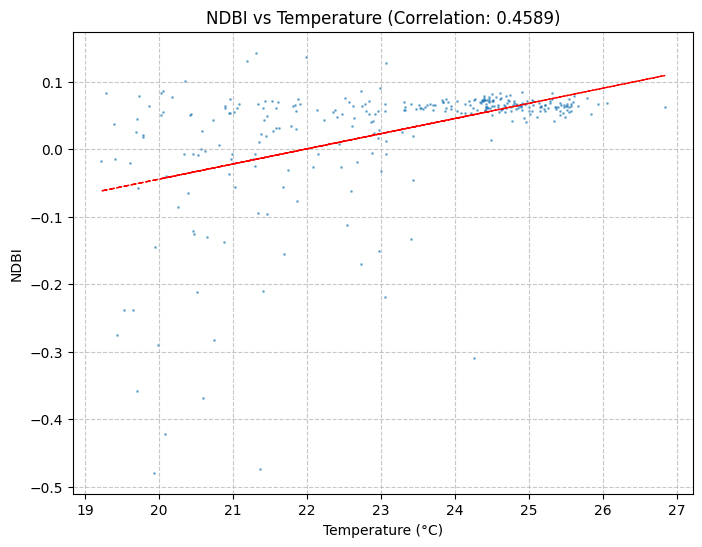

In [29]:
r_value_ndbi = lab_Yuma.calculate_correlation("NDBI", "2023-01-01", "2023-02-01", tensor=False)
print(f"Correlation (Temperature vs NDBI): {r_value_ndbi}")